**Orie 3120 — Milestone One and Two**

Group 45: Yousuf Qaum, Kayla Levy, Drew Wilenzick, Lauren Jun

**Data Set Description:** Our group is using the "Most Streamed Spotify Songs 2023" data set available on Kaggle. This dataset includes the following features on the most famous songs of 2023 on the Spotify platform.

Features:
* track_name: Name of the song
* artist(s)_name: Name of the artist(s) of the song
* artist_count: Number of artists contributing to the song
* released_year: Year when the song was released
* released_month: Month when the song was released
* released_day: Day of the month when the song was released
* in_spotify_playlists: Number of Spotify playlists the song is included in
* in_spotify_charts: Presence and rank of the song on Spotify charts
* streams: Total number of streams on Spotify
* in_apple_playlists: Number of Apple Music playlists the song is included in
* in_apple_charts: Presence and rank of the song on Apple Music charts
* in_deezer_playlists: Number of Deezer playlists the song is included in
* in_deezer_charts: Presence and rank of the song on Deezer charts
* in_shazam_charts: Presence and rank of the song on Shazam charts
* bpm: Beats per minute, a measure of song tempo
* key: Key of the song
* mode: Mode of the song (major or minor)
* danceability_%: Percentage indicating how suitable the song is for dancing
* valence_%: Positivity of the song's musical content
* energy_%: Perceived energy level of the song
* acousticness_%: Amount of acoustic sound in the song
* instrumentalness_%: Amount of instrumental content in the song
* liveness_%: Presence of live performance elements
* speechiness_%: Amount of spoken words in the song

**Questions We Have:**

1) First question

2) Second question

3) Third question [example: What is the relation between higher speechines percentages and stream counts? Specifically does higher speechines result in higher or lower stream counts?]






*Note: Spotify considers any time a track is listened to for 30 seconds or more as a stream. This means that if a person listens to a song for 30 seconds, and then additional 30 seconds, Spotify will count this listening behavior as two streams.*


Links:

Dataset: https://www.kaggle.com/datasets/nelgiriyewithana/top-spotify-songs-2023

Spotify Track Information: https://soundcamps.com/blog/spotify-streams-vs-spotify-monthly-listeners/

https://developer.spotify.com/documentation/web-api/reference/get-audio-features

In [ ]:
#Beginning with the necessary imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix



In [ ]:
#Loading file and viewing first few rows

path = "spotify-2023.csv"
df = pd.read_csv(path, encoding = "latin-1", thousands=',')
df.head()

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,147,141381703,43,...,125,B,Major,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,...,92,C#,Major,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,...,138,F,Major,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,...,170,A,Major,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,...,144,A,Minor,65,23,80,14,63,11,6


In [ ]:
#Let's clean the data. First, let's check if there is any data that is missing.
df.isnull().sum()

track_name               0
artist(s)_name           0
artist_count             0
released_year            0
released_month           0
released_day             0
in_spotify_playlists     0
in_spotify_charts        0
streams                  0
in_apple_playlists       0
in_apple_charts          0
in_deezer_playlists      0
in_deezer_charts         0
in_shazam_charts        50
bpm                      0
key                     95
mode                     0
danceability_%           0
valence_%                0
energy_%                 0
acousticness_%           0
instrumentalness_%       0
liveness_%               0
speechiness_%            0
dtype: int64

In [ ]:
#Given that data is missing for in_shazam_charts and key. In_shazam_charts is a continuous variable, and key is a string category.

print(df["in_shazam_charts"].describe())
#For the missing information in in_shazam_charts, we will fill the values with zero.
df["in_shazam_charts"] = df["in_shazam_charts"].fillna(value=0)

print("# of null values = ", pd.isna(df["in_shazam_charts"]).sum())


count     903.000000
mean       59.995570
std       161.161093
min         0.000000
25%         0.000000
50%         2.000000
75%        37.000000
max      1451.000000
Name: in_shazam_charts, dtype: float64
# of null values =  0


In [ ]:
#Now let's figure out how to deal with the missing key data.

"""Looking at the key data, we can see we can't just put 0 in for missing information.
Because we're not going to use key column for any of our visualizations, we can remove the key column."""

df = df.drop(["key"], axis = 1)


In [ ]:
#Now that we've cleaned the data, let's describe the data
df.describe()

,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
count,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.00000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000
mean,1.556139,2018.238195,6.033578,13.930745,5200.124869,12.009444,67.812172,51.908709,385.187828,2.666317,56.847849,122.540399,66.96957,51.431270,64.279119,27.057712,1.581322,18.213012,10.131165
std,0.893044,11.116218,3.566435,9.201949,7897.608990,19.575992,86.441493,50.630241,1130.535561,6.035599,157.441749,28.057802,14.63061,23.480632,16.550526,25.996077,8.409800,13.711223,9.912888
min,1.000000,1930.000000,1.000000,1.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65.000000,23.00000,4.000000,9.000000,0.000000,0.000000,3.000000,2.000000
25%,1.000000,2020.000000,3.000000,6.000000,875.000000,0.000000,13.000000,7.000000,13.000000,0.000000,0.000000,100.000000,57.00000,32.000000,53.000000,6.000000,0.000000,10.000000,4.000000
50%,1.000000,2022.000000,6.000000,13.000000,2224.000000,3.000000,34.000000,38.000000,44.000000,0.000000,2.000000,121.000000,69.00000,51.000000,66.000000,18.000000,0.000000,12.000000,6.000000
75%,2.000000,2022.000000,9.000000,22.000000,5542.000000,16.000000,88.000000,87.000000,164.000000,2.000000,33.000000,140.000000,78.00000,70.000000,77.000000,43.000000,0.000000,24.000000,11.000000
max,8.000000,2023.000000,12.000000,31.000000,52898.000000,147.000000,672.000000,275.000000,12367.000000,58.000000,1451.000000,206.000000,96.00000,97.000000,97.000000,97.000000,91.000000,97.000000,64.000000


In [ ]:
#Additionally, the streams datatype is an object and there's a weird object in here somewhere with
# 'BPM110KeyAModeMajorDanceability53Valence75Energy69Acousticness7Instrumentalness0Liveness17Speechiness3' in row 575 [574]


df["streams"].dtype

df["streams"][574]

df.drop(574, axis = 0, inplace = True)


In [ ]:
#One more here to make sure no more issues appear with data
df['streams'] = pd.to_numeric(df['streams'], errors='coerce')

In [ ]:
#Calculating average data from continuous variables

columns = df.columns #list of columns
mean = df[columns].mean(numeric_only = True)
print(mean)

artist_count            1.556723e+00
released_year           2.018289e+03
released_month          6.038866e+00
released_day            1.394433e+01
in_spotify_playlists    5.202565e+03
in_spotify_charts       1.202206e+01
streams                 5.141374e+08
in_apple_playlists      6.786660e+01
in_apple_charts         5.196324e+01
in_deezer_playlists     3.855357e+02
in_deezer_charts        2.669118e+00
in_shazam_charts        5.690756e+01
bpm                     1.225536e+02
danceability_%          6.698424e+01
valence_%               5.140651e+01
energy_%                6.427416e+01
acousticness_%          2.707878e+01
instrumentalness_%      1.582983e+00
liveness_%              1.821429e+01
speechiness_%           1.013866e+01
dtype: float64


**Training and Testing Set**

We will split the data so that 75% of our data set is used for our training set, and the remaining 25% set of our data will be used for our testing set.  Streams will be our independent variable.

In [ ]:
X = df[["artist_count", "released_year", "released_month", "released_day", "in_spotify_playlists", \
        "in_spotify_charts", "in_apple_playlists", "in_apple_charts","in_deezer_charts", "bpm", "danceability_%", \
        "valence_%", "energy_%","acousticness_%", "instrumentalness_%", "liveness_%", "speechiness_%" ]]

y = df["streams"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [ ]:
#Question Three: Relation between speechiness and stream counts

#y

#Need to also specify titles and stuff

#sns.lineplot(data = df, x= df["speechiness_%"], y= df["streams"])

#plt.lineplot(data = df, x= df["speechiness_%"], y= df["streams"])

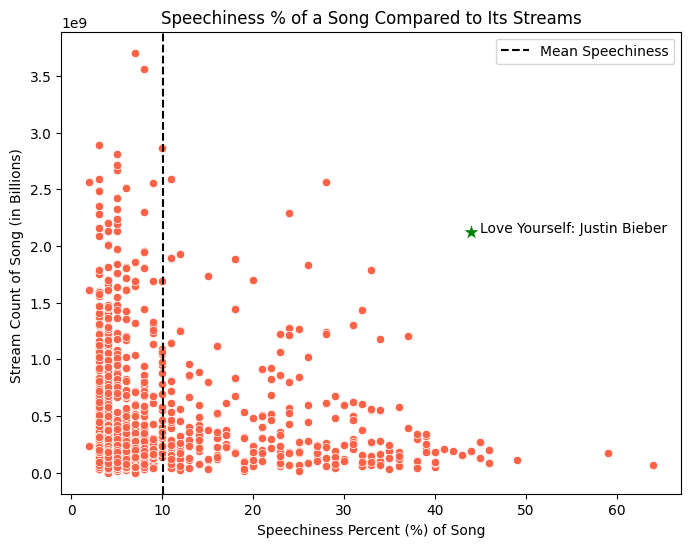

In [ ]:
plt.figure(figsize=(8, 6))

plt.title("Speechiness % of a Song Compared to Its Streams")
plt.xlabel("Speechiness Percent (%) of Song")
plt.ylabel("Stream Count of Song (in Billions) ")
speechmean = df["speechiness_%"].mean()

sns.scatterplot(x=df['speechiness_%'], y=df["streams"], data=df, color='tomato', marker='o')
highlight_df = pd.DataFrame({'speechiness_%': [df.loc[762, 'speechiness_%']], 'streams': [df.loc[762, 'streams']]})
sns.scatterplot(x='speechiness_%', y='streams', data=highlight_df, color='green', marker='*', s=200)

plt.axvline(x=speechmean, color='black', linestyle='--', label='Mean Speechiness')
plt.text(df.loc[762, 'speechiness_%'] + 1, df.loc[762, 'streams'],\
         'Love Yourself: Justin Bieber', fontsize=10, bbox=dict(facecolor='white', alpha=0.00))
plt.legend()
plt.show()


In [ ]:
#Find song where speechiness greater than 40% and count of songs greater than 2 billion
df["streams"] > 2000000000

interesting = (df["streams"] > 2000000000) & (df["speechiness_%"] > 40)
df[interesting]


,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,in_shazam_charts,bpm,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
762,Love Yourself,Justin Bieber,1,2015,11,9,22730,5,2123309722,289,...,36.0,100,Major,61,53,38,84,0,28,44


In [ ]:
#LINEAR REGRESSION QUESTION ONE:

musical_attributes = ['danceability_%', 'valence_%', 'energy_%', 'acousticness_%', 'instrumentalness_%', 'liveness_%', 'speechiness_%']
y = df['streams']

X = df[musical_attributes]
X = sm.add_constant(X)
model = sm.OLS(y,X).fit()
model.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                streams   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     4.039
Date:                Wed, 15 May 2024   Prob (F-statistic):           0.000226
Time:                        00:43:19   Log-Likelihood:                -20524.
No. Observations:                 952   AIC:                         4.106e+04
Df Residuals:                     944   BIC:                         4.110e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               9.918e+08   1.39e+08      7.151      0.000     7.2e+08    1.26e+09
danceability_%     -4.091e+06   1.43e+06     -2.852      0.004   -6.91e+06   -1.28e+06
valence_%           1.702e+05   9.26e+05      0.184      0.854   -1.65e+06    1.99e+06
energy_%           -1.113e+06   1.47e+06     -0.757      0.449      -4e+06    1.77e+06
acousticness_%     -1.098e+06   8.93e+05     -1.229      0.219   -2.85e+06    6.55e+05
instrumentalness_% -4.295e+06   2.19e+06     -1.959      0.050    -8.6e+06    6825.966
liveness_%         -2.505e+06   1.34e+06     -1.865      0.063   -5.14e+06    1.32e+05
speechiness_%      -5.784e+06   1.87e+06     -3.088      0.002   -9.46e+06   -2.11e+06
==============================================================================
Omnibus:                      378.566   Durbin-Watson:                   1.522
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1338.868
Skew:                           1.946   Prob(JB):                    1.86e-291
Kurtosis:                       7.313   Cond. No.                         865.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

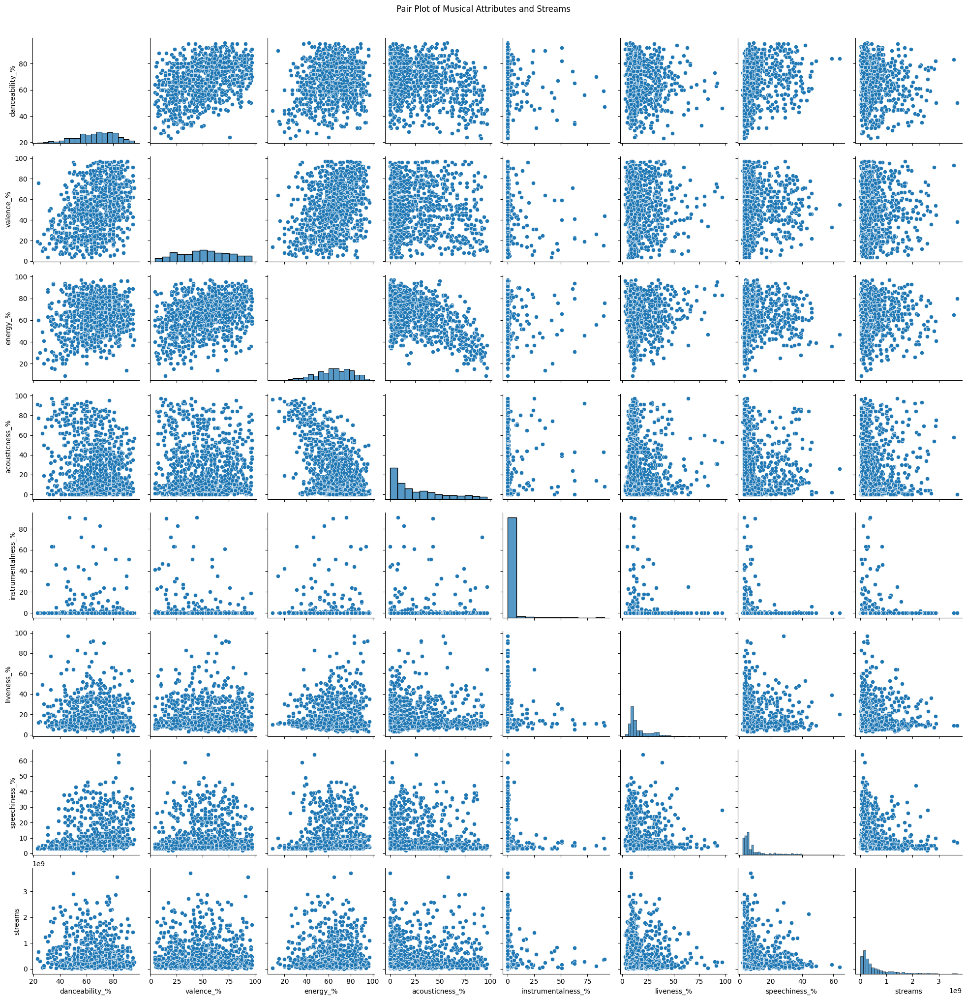

In [ ]:
sns.pairplot(df, vars=musical_attributes + ['streams'])
plt.suptitle('Pair Plot of Musical Attributes and Streams', y=1.02)
plt.show()

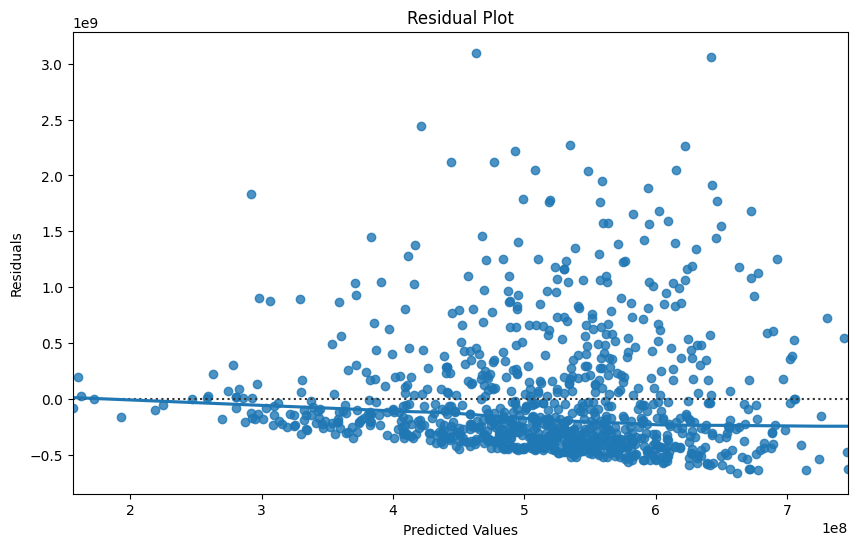

In [ ]:
# Predicting the values
predictions = model.predict(X)

# Calculating residuals
residuals = y - predictions
#
# Creating the residual plot
plt.figure(figsize=(10, 6))
sns.residplot(x=predictions, y=residuals, lowess=True)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

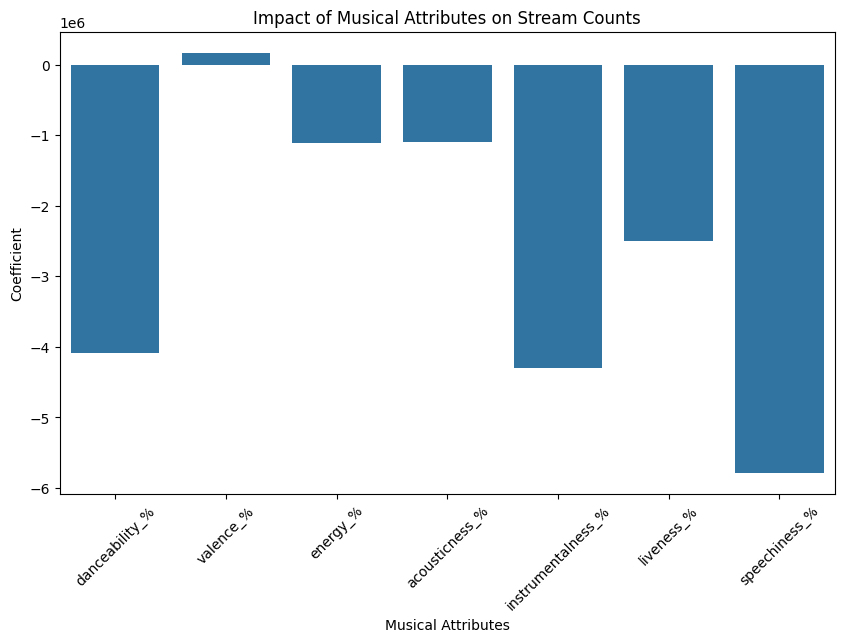

In [ ]:
coefficients = model.params[1:]  # Excluding the constant
attributes = coefficients.index

# Creating the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=attributes, y=coefficients.values)
plt.xlabel('Musical Attributes')
plt.ylabel('Coefficient')
plt.title('Impact of Musical Attributes on Stream Counts')
plt.xticks(rotation=45)
plt.show()

In [ ]:
trimmed_attributes = ['danceability_%', 'instrumentalness_%', 'liveness_%', 'speechiness_%']
y = df['streams']

X = df[trimmed_attributes]
X = sm.add_constant(X)
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                streams   R-squared:                       0.028
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     6.695
Date:                Wed, 15 May 2024   Prob (F-statistic):           2.58e-05
Time:                        00:43:46   Log-Likelihood:                -20525.
No. Observations:                 952   AIC:                         4.106e+04
Df Residuals:                     947   BIC:                         4.108e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               8.784e+08   9.15e+07      9.605      0.000    6.99e+08    1.06e+09
danceability_%     -3.771e+06   1.27e+06     -2.968      0.003   -6.27e+06   -1.28e+06
instrumentalness_%  -4.37e+06   2.18e+06     -2.009      0.045   -8.64e+06      -1e+05
liveness_%         -2.528e+06   1.33e+06     -1.900      0.058   -5.14e+06    8.29e+04
speechiness_%      -5.785e+06   1.87e+06     -3.096      0.002   -9.45e+06   -2.12e+06
==============================================================================
Omnibus:                      376.143   Durbin-Watson:                   1.529
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1315.506
Skew:                           1.938   Prob(JB):                    2.20e-286
Kurtosis:                       7.259   Cond. No.                         361.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
predictions_main = model_main.predict(X_main)
predictions_trimmed = model_trimmed.predict(X_trimmed)
plt.figure(figsize=(10, 6))
plt.scatter(y, predictions_main, alpha=0.5, label='Main Model', color = "darkgreen")
plt.scatter(y, predictions_trimmed, alpha=0.5, label='Trimmed Model', color='lightsalmon')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.xlabel('Actual Streams')
plt.ylabel('Predicted Streams')
plt.title('Predicted vs Actual Stream Counts')
plt.legend()

plt.annotate(f"Main Model R-squared: {model_main.rsquared:.3f}",
             xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='blue')
plt.annotate(f"Trimmed Model R-squared: {model_trimmed.rsquared:.3f}",
             xy=(0.05, 0.90), xycoords='axes fraction', fontsize=12, color='orange')

plt.show()

NameError: name 'model_main' is not defined

In [ ]:
from sklearn.metrics import mean_absolute_error


mae_main = mean_absolute_error(y, predictions_main)
mae_trimmed = mean_absolute_error(y, predictions_trimmed)

plt.figure(figsize=(10, 6))
plt.scatter(y, predictions_main, alpha=0.3, label='Main Model', color='blue')
plt.scatter(y, predictions_trimmed, alpha=0.3, label='Trimmed Model', color='orange')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.xlabel('Actual Streams')
plt.ylabel('Predicted Streams')
plt.title('Predicted vs Actual Stream Counts')
plt.legend()

plt.annotate(f"Main Model R-squared: {model_main.rsquared:.3f}",
             xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='blue')
plt.annotate(f"Main Model MAE: {mae_main:.2f}",
             xy=(0.05, 0.90), xycoords='axes fraction', fontsize=12, color='blue')

plt.annotate(f"Trimmed Model R-squared: {model_trimmed.rsquared:.3f}",
             xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12, color='orange')
plt.annotate(f"Trimmed Model MAE: {mae_trimmed:.2f}",
             xy=(0.05, 0.80), xycoords='axes fraction', fontsize=12, color='orange')

plt.show()

In [ ]:
#QUESTION THREE EXPANDED

coefficients = []
attributes = []


for attribute in musical_attributes:
    X = df[[attribute]]
    y = df['streams']

    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()

    coefficients.append(model.params[1])
    attributes.append(attribute)

    print(f"Regression Results for {attribute}:")
    print(model.summary())
    print("\n")


In [ ]:
plt.figure(figsize=(10, 6))
plt.barh(attributes, coefficients, color='skyblue')
plt.xlabel('Coefficient')
plt.ylabel('Musical Attribute')
plt.title('Coefficients of Linear Regression Models')
plt.grid(axis='x')
plt.show()

In [ ]:
X = df[['danceability_%', 'valence_%', 'energy_%', 'acousticness_%', 'instrumentalness_%', 'liveness_%', 'speechiness_%']]
X = sm.add_constant(X)
y = df['streams']
model = sm.OLS(y, X).fit()
model.summary()

coefficients = model.params[1:]


plt.figure(figsize=(10, 6))
coefficients.plot(kind='bar', color='skyblue')
plt.xlabel('Musical Attribute')
plt.ylabel('Coefficient')
plt.title('Coefficients of Linear Regression Model')
plt.grid(axis='y')
plt.xticks(rotation=45)
plt.show()



In [ ]:
predicted_values = model.predict(X)

plt.scatter(y, predicted_values)
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title('Observed vs Predicted Values')
plt.show()

In [ ]:
residuals = model.resid

plt.scatter(df.index, residuals)
plt.xlabel('Index')
plt.ylabel('Residuals')
plt.title('Residuals vs Index')
plt.show()

In [ ]:
plt.scatter(predicted_values, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.show()


In [ ]:
plt.hist(residuals, bins=20)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

sm.qqplot(residuals, line='r')
plt.title('Q-Q Plot of Residuals')
plt.show()

In [ ]:
#LOGISTIC CURIOSU



In [ ]:
df['is_group'] = df['artist_count'] > 1

X = df[['danceability_%', 'valence_%', 'energy_%', 'acousticness_%', 'instrumentalness_%', 'liveness_%', 'speechiness_%']]
y = df['is_group']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

print("Classification Report:")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

In [ ]:
#Question 2  Relation between month released and stream counts

In [ ]:

#it is important to take into account the number of songs released each month because
#months that release more songs would typically have more streams
#so we find the ratio of streams to song released


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'df' is your DataFrame and it has 'released_month', 'streams', and 'track_name' columns

# Calculate total streams per month
total_streams_per_month = df.groupby('released_month')['streams'].sum()

# Calculate the number of songs released per month
songs_released_per_month = df.groupby('released_month')['track_name'].count()

# Calculate the ratio of total streams to the number of songs for each month
ratio_streams_to_songs = total_streams_per_month / songs_released_per_month

# Plotting the ratio
plt.figure(figsize=(8, 6))
plt.bar(ratio_streams_to_songs.index, ratio_streams_to_songs.values, color='blue')
plt.title("Ratio of Streams to Songs Released Each Month")
plt.xlabel("Month")
plt.ylabel("Ratio of Streams to Songs")

# Note: The legend might not be necessary here as we are plotting a single metric.
# However, if you add more categories, consider uncommenting the legend line and providing labels.
# plt.legend()

plt.show()

In [ ]:
print("Ratio January:", ratio_streams_to_songs.loc[1])

# Print the y-axis value for month 3
print("Ratio September::", ratio_streams_to_songs.loc[9])

In [ ]:
#streams relation to solo artist song vs group song
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

df['is_group'] = (df['artist_count'] > 1).astype(int)


median_streams = df['streams'].median()


df['above_median_streams'] = df['streams'] > median_streams


X = df[['is_group']]
y = df['above_median_streams']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', s
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
import matplotlib.pyplot as plt
df['streams'].hist(bins=50)
plt.title('Distribution of Streams')
plt.xlabel('Streams')
plt.ylabel('Frequency')
plt.show()

print("Tracks above average streams:", (df['above_average_streams'].sum() / len(df)) * 100, "%")


In [ ]:
print(df["in_apple_charts"].describe())
#For the missing information in in_shazam_charts, we will fill the values with zero.
zeros_removed = df[(df["in_apple_charts"] >= 1) & (df["in_spotify_charts"] >= 1)& (df["in_shazam_charts"] >= 1)]
#zero_on_charts_spotify = df[df["in_spotify_charts"]>=1]
# print("# of null values = ", pd.isna(df["in_shazam_charts"]).sum())
print(zeros_removed.describe())
print(zeros_removed.head())


In [ ]:
# Visualization comparing playlist inclusions
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='in_spotify_playlists', y='in_apple_playlists', hue='released_year')
plt.title('Comparison of Spotify and Apple Music Playlist Inclusions')
plt.xlabel('Number of Spotify Playlists')
plt.ylabel('Number of Apple Music Playlists')
plt.legend(title='Released Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# Visualization comparing chart presence
plt.figure(figsize=(10, 6))
sns.scatterplot(data=zeros_removed, x='in_spotify_charts', y='in_apple_charts', hue='released_year')
plt.title('Comparison of Spotify and Apple Music Chart Rankings')
plt.xlabel('Spotify Chart Rank')
plt.ylabel('Apple Music Chart Rank')
plt.xlim(0, 100)  # Assuming top 100 charts
plt.ylim(0, 100)
plt.legend(title='Release Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gca().invert_xaxis()  # Higher ranks (closer to 1) should be on the left
plt.gca().invert_yaxis()  # Similarly, invert y-axis
plt.grid(True)
plt.show()

In [ ]:
# Visualization comparing chart presence
plt.figure(figsize=(10, 6))
sns.scatterplot(data=zeros_removed, x='in_apple_charts', y='in_shazam_charts', hue='released_year')
plt.title('Comparison of Shazam and Apple Music Chart Rankings')
plt.xlabel('Apple Chart Rank')
plt.ylabel('Shazam Music Chart Rank')
plt.xlim(0, 100)  # Assuming top 100 charts
plt.ylim(0, 100)
plt.legend(title='Release Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gca().invert_xaxis()  # Higher ranks (closer to 1) should be on the left
plt.gca().invert_yaxis()  # Similarly, invert y-axis
plt.grid(True)
plt.show()

In [ ]:
# Visualization comparing chart presence
plt.figure(figsize=(10, 6))
sns.scatterplot(data=zeros_removed, x='in_spotify_charts', y='in_shazam_charts', hue='released_year')
plt.title('Comparison of Spotify and Shazam Music Chart Rankings')
plt.xlabel('Spotify Chart Rank')
plt.ylabel('Shazam Music Chart Rank')
plt.xlim(0, 100)  # Assuming top 100 charts
plt.ylim(0, 100)
plt.legend(title='Release Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gca().invert_xaxis()  # Higher ranks (closer to 1) should be on the left
plt.gca().invert_yaxis()  # Similarly, invert y-axis
plt.grid(True)
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=zeros_removed, x='streams', y='in_spotify_charts', hue='released_year')
plt.title('Comparison of Spotify steams and charts')
plt.xlabel('Streams')
plt.ylabel('Spotify chart')
plt.legend(title='Released Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='released_year', y='bpm', hue='released_year', data=df, palette='muted', legend=False)
plt.title('Distribution of Song Tempos Over Years')
plt.xlabel('Released Year')
plt.ylabel('Beats per Minute (BPM)')
plt.grid(True)
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='released_year', y='valence_%', data=df, palette='Set2')
plt.title('Distribution of Song Valence Over Years')
plt.xlabel('Released Year')
plt.ylabel('Valence (%)')
plt.grid(True)
plt.show()

In [ ]:
#Regressions
import pandas as pd

data = pd.read_csv('spotify-2023.csv', encoding='ISO-8859-1')

data.head()

In [ ]:
import statsmodels.api as sm

In [ ]:
data.columns

In [ ]:
#YQ See here:

In [ ]:
import statsmodels.api as smf

# Selecting predictors and the response variable
predictors = ['in_spotify_playlists', 'bpm', 'danceability_%', 'energy_%', 'acousticness_%']
X = data[predictors]
y = data['streams']

non_numeric_streams = data['streams'].apply(lambda x: isinstance(x, str) and not x.isdigit())
data.loc[non_numeric_streams, 'streams'].unique()

cleaned_data = data[~non_numeric_streams]

cleaned_data['streams'] = cleaned_data['streams'].astype(int)

X_cleaned = cleaned_data[predictors]
y_cleaned = cleaned_data['streams']

X_cleaned = sm.add_constant(X_cleaned)

model_cleaned = sm.OLS(y_cleaned, X_cleaned)

results_cleaned = model_cleaned.fit()

results_cleaned.summary()

In [ ]:
import statsmodels.formula.api as smf

In [ ]:

cleaned_data_renamed = cleaned_data.rename(columns=lambda x: x.replace('%', 'pct'))

formula_renamed = """
streams ~ in_spotify_playlists + bpm + danceability_pct + valence_pct + energy_pct + acousticness_pct
         + instrumentalness_pct + liveness_pct + speechiness_pct
         + C(key) + C(mode)
"""

model_formula_renamed = smf.ols(formula_renamed, data=cleaned_data_renamed)

results_formula_renamed = model_formula_renamed.fit()

results_formula_renamed.summary()


In [ ]:
import statsmodels.formula.api as smf

cleaned_data_renamed = cleaned_data.rename(columns=lambda x: x.replace('%', 'pct'))

formula_renamed = """
streams ~ in_spotify_playlists + bpm + danceability_pct + valence_pct + energy_pct + acousticness_pct
         + instrumentalness_pct + liveness_pct + speechiness_pct
         + C(key) + C(mode)
"""

model_formula_renamed = smf.ols(formula_renamed, data=cleaned_data_renamed)

results_formula_renamed = model_formula_renamed.fit()

summary = results_formula_renamed.summary()
print(summary)


In [ ]:
p_values = results_formula_renamed.pvalues
p_values

In [ ]:
coefs = results_formula_renamed.pvalues
coefs

In [ ]:
p_values[p_values < .25]

In [ ]:
coefs[p_values < .25]

In [ ]:
p_values[p_values < .1]

In [ ]:
results_formula_renamed.params[p_values < .25]

In [ ]:
new_formula = """
streams ~ in_spotify_playlists + speechiness_pct
"""

# Step 3: Fit the new model
new_model = smf.ols(new_formula, data=cleaned_data_renamed)
new_results = new_model.fit()
new_results.summary()


In [ ]:
import pandas as pd
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming `cleaned_data` is your dataframe
cleaned_data_renamed = cleaned_data.rename(columns=lambda x: x.replace('%', 'pct'))

# Define the new formula
new_formula = """
streams ~ in_spotify_playlists + speechiness_pct
"""

# Fit the new model
new_model = smf.ols(new_formula, data=cleaned_data_renamed)
new_results = new_model.fit()

# Make predictions
cleaned_data_renamed['predicted_streams'] = new_results.predict(cleaned_data_renamed)

# Create a scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='streams', y='predicted_streams', data=cleaned_data_renamed, color='blue', alpha=0.6)
plt.plot([cleaned_data_renamed['streams'].min(), cleaned_data_renamed['streams'].max()],
         [cleaned_data_renamed['streams'].min(), cleaned_data_renamed['streams'].max()],
         color='red', lw=2)

plt.title('Actual vs. Predicted Streams')
plt.xlabel('Actual Streams')
plt.ylabel('Predicted Streams')
plt.show()


In [ ]:

formula_pval = """
streams ~ in_spotify_playlists + energy_pct + acousticness_pct
         + instrumentalness_pct + speechiness_pct """

model_formula_pval= smf.ols(formula_pval, data=cleaned_data_renamed)

results_formula_pval = model_formula_pval.fit()

results_formula_pval.summary()


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Load the Top 5000 albums dataset
albums_data = pd.read_csv('Top5000.csv', encoding='ISO-8859-1')

# Convert num_rat from string to numeric (remove commas)
albums_data['num_rat'] = albums_data['num_rat'].astype(str).str.replace(',', '').astype(float)

# Handle missing values by dropping rows with any missing values
albums_data.dropna(inplace=True)

# Create the binary target variable based on median average rating
median_rating = albums_data['avg_rat'].median()
albums_data['high_rating'] = (albums_data['avg_rat'] > median_rating).astype(int)

# Select relevant features for logistic regression
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'duration_ms', 'time_signature', 'num_rat']
X = albums_data[features]
y = albums_data['high_rating']

# Add a constant term for the intercept
X = sm.add_constant(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Fit the logistic regression model using statsmodels
logit_model = sm.Logit(y_train, X_train).fit()

# Print the summary of the model
logit_summary = logit_model.summary2().tables[1]
print(logit_summary)

# Make predictions on the test set
y_pred_prob = logit_model.predict(X_test)
y_pred = (y_pred_prob > 0.5).astype(int)

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(class_report)

# Display the confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Low Rating', 'High Rating'], yticklabels=['Low Rating', 'High Rating'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

# Get and display the coefficients and p-values
coefficients = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': logit_model.params,
    'P-value': logit_model.pvalues
})
print(coefficients)

# Plot the coefficients
plt.figure(figsize=(12, 8))
sns.barplot(x='Coefficient', y='Feature', data=coefficients)
plt.title('Feature Coefficients in the Logistic Regression Model')
plt.show()

# Plot the p-values
plt.figure(figsize=(12, 8))
sns.barplot(x='P-value', y='Feature', data=coefficients)
plt.title('P-values of Features in the Logistic Regression Model')
plt.show()


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Install imblearn
!pip install imblearn

# Import SMOTE from imblearn
from imblearn.over_sampling import SMOTE

# Load the Top 5000 albums dataset
albums_data = pd.read_csv('Top5000.csv', encoding='ISO-8859-1')

# Convert num_rat from string to numeric (remove commas)
albums_data['num_rat'] = albums_data['num_rat'].astype(str).str.replace(',', '').astype(float)

# Handle missing values by dropping rows with any missing values
albums_data.dropna(inplace=True)

# Create the binary target variable based on median average rating
median_rating = albums_data['avg_rat'].median()
albums_data['high_rating'] = (albums_data['avg_rat'] > median_rating).astype(int)

# Select relevant features for logistic regression
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'duration_ms', 'time_signature', 'num_rat']
X = albums_data[features]
y = albums_data['high_rating']

# Add a constant term for the intercept
X = sm.add_constant(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply SMOTE to balance the classes
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

# Fit the logistic regression model using statsmodels on the balanced data
logit_model_res = sm.Logit(y_res, X_res).fit()

# Print the summary of the model
logit_summary_res = logit_model_res.summary2().tables[1]
print(logit_summary_res)

# Make predictions on the test set
y_pred_prob_res = logit_model_res.predict(X_test)
y_pred_res = (y_pred_prob_res > 0.5).astype(int)

# Evaluate the model
conf_matrix_res = confusion_matrix(y_test, y_pred_res)
class_report_res = classification_report(y_test, y_pred_res)
accuracy_res = accuracy_score(y_test, y_pred_res)

print(f"Accuracy: {accuracy_res}")
print("Classification Report:")
print(class_report_res)

# Display the confusion matrix with detailed labels
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_res, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted: Low Rating', 'Predicted: High Rating'], yticklabels=['Actual: Low Rating', 'Actual: High Rating'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix After SMOTE')
plt.show()

# Get and display the coefficients and p-values for the balanced model
coefficients_res = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': logit_model_res.params,
    'P-value': logit_model_res.pvalues
})
print(coefficients_res)

# Plot the coefficients for the balanced model
plt.figure(figsize=(12, 8))
sns.barplot(x='Coefficient', y='Feature', data=coefficients_res)
plt.title('Feature Coefficients in the Logistic Regression Model After SMOTE')
plt.show()

# Plot the p-values for the balanced model
plt.figure(figsize=(12, 8))
sns.barplot(x='P-value', y='Feature', data=coefficients_res)
plt.title('P-values of Features in the Logistic Regression Model After SMOTE')
plt.show()


In [ ]:
#testing assumptions
X = df[["artist_count", "released_year", "released_month", "released_day", "in_spotify_playlists", \
        "in_spotify_charts", "in_apple_playlists", "in_apple_charts","in_deezer_charts", "bpm", "danceability_%", \
        "valence_%", "energy_%","acousticness_%", "instrumentalness_%", "liveness_%", "speechiness_%" ]]

Y = df["streams"]
X = sm.add_constant(X)


model = sm.OLS(Y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                streams   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     154.1
Date:                Wed, 15 May 2024   Prob (F-statistic):          7.45e-257
Time:                        00:44:00   Log-Likelihood:                -19902.
No. Observations:                 952   AIC:                         3.984e+04
Df Residuals:                     934   BIC:                         3.993e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -6.476e+09 

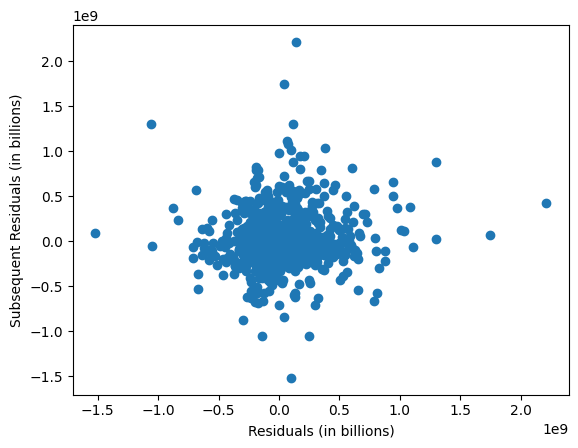

In [ ]:
#scatter plot of residual vs residual from regression model to asses the independence #assumption of linear regression
resid = model.resid

plt.xlabel('Residuals (in billions)')
plt.ylabel('Subsequent Residuals (in billions)')

plt.scatter(resid[:-1], resid[1:])


(array([-10,  -9,  -8,  -7,  -6,  -5,  -4,  -3,  -2,  -1,   0,   1,   2,
          3,   4,   5,   6,   7,   8,   9,  10]),
 array([7.89329737e-02, 5.25049637e-02, 6.87774417e-02, 6.17743454e-02,
        1.26546176e-01, 6.21124418e-03, 1.32468225e-02, 6.95299557e-04,
        5.90770877e-02, 1.04298160e-01, 1.00000000e+00, 1.04298160e-01,
        5.90770877e-02, 6.95299557e-04, 1.32468225e-02, 6.21124418e-03,
        1.26546176e-01, 6.17743454e-02, 6.87774417e-02, 5.25049637e-02,
        7.89329737e-02]),
 <matplotlib.lines.Line2D at 0x7bebe1f4f010>)

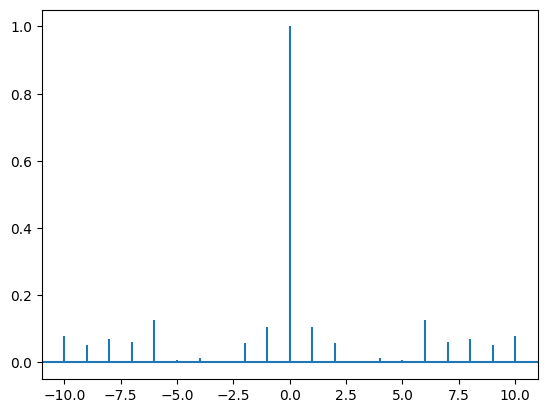

In [ ]:
#tests autocorrelation in the residuals, which indicates whether
# residuals are independent of each other.
plt.acorr(resid)


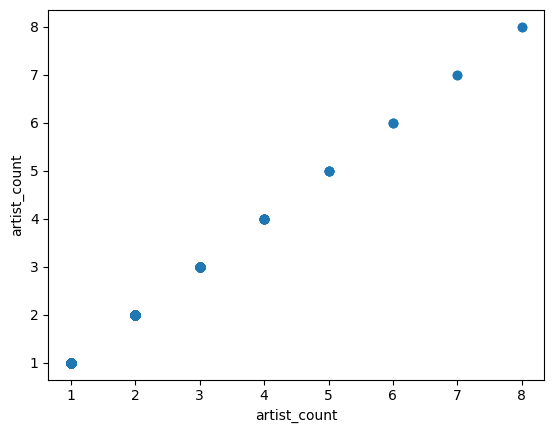

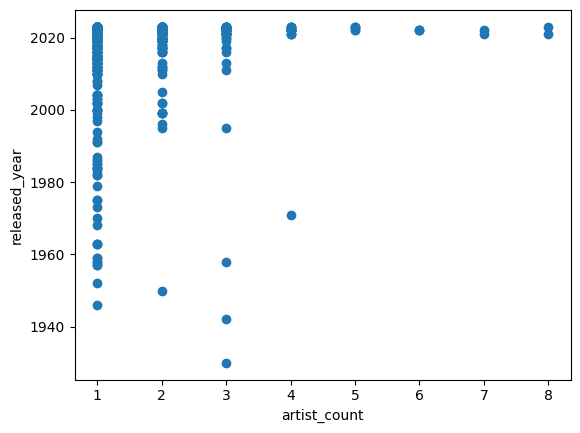

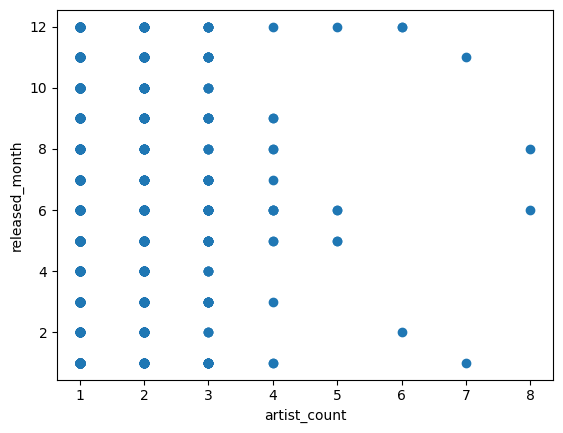

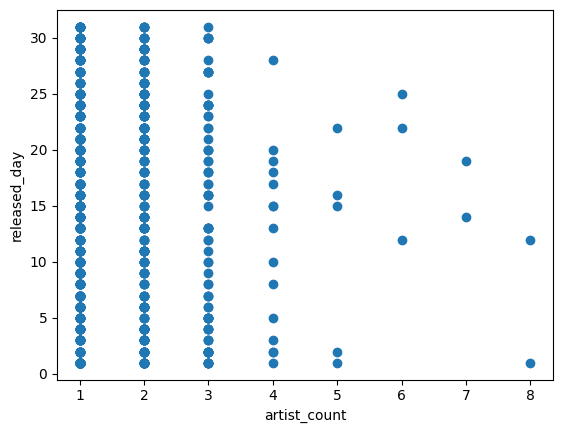

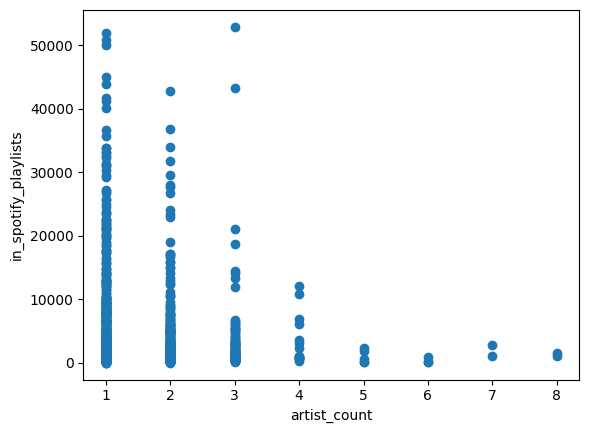

...

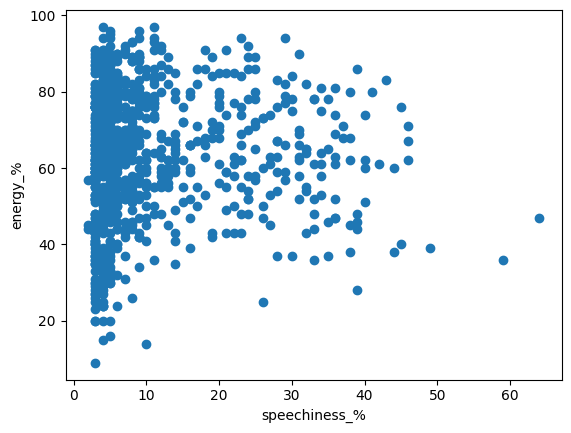

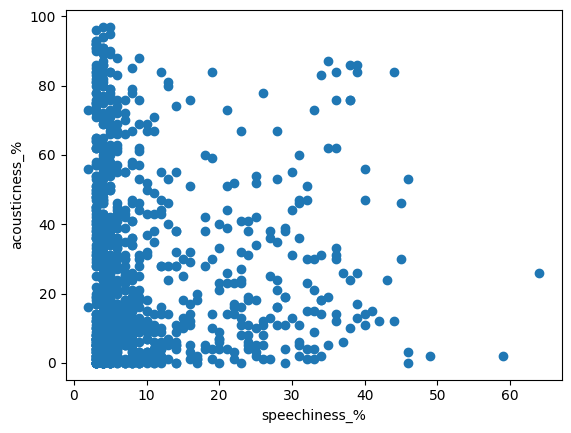

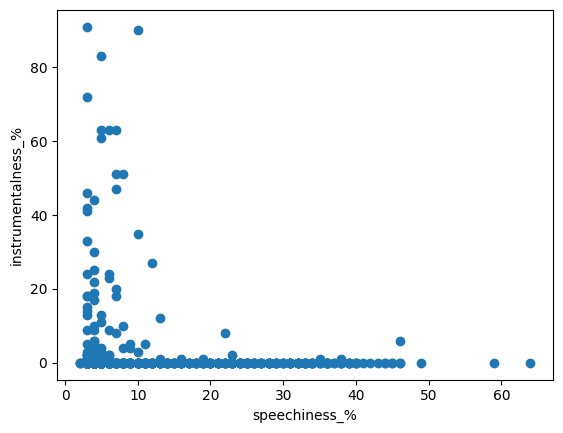

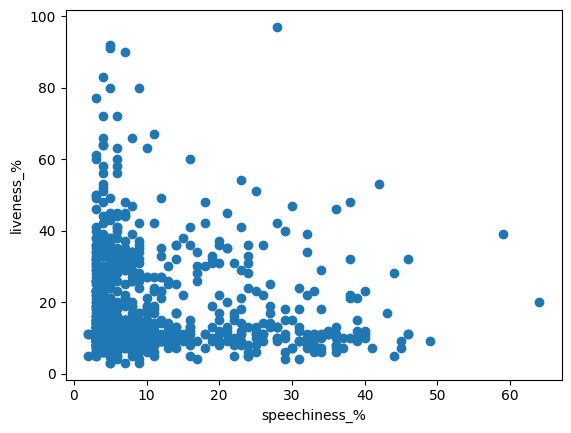

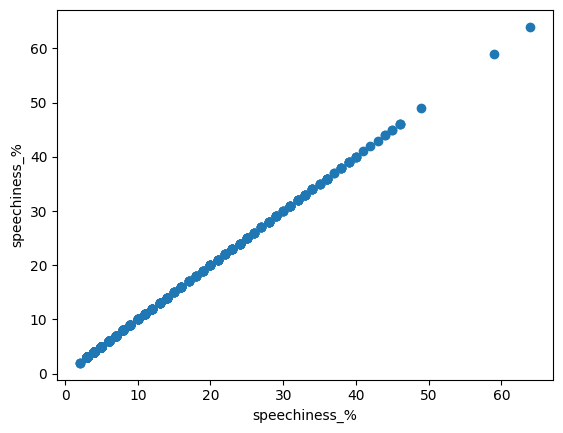

In [ ]:
#test linearity, or independence of residuals and covariates
cols = df.columns[2:]
for i in cols:
  for j in cols:
      plt.scatter(df[i],df[j])
      plt.xlabel(i)
      plt.ylabel(j)
      plt.show()

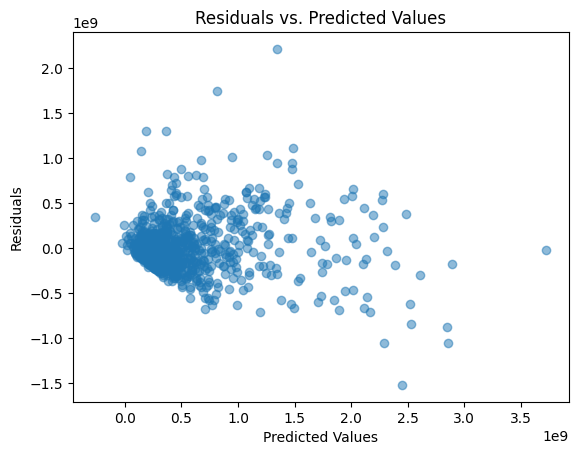

                            OLS Regression Results                            
Dep. Variable:                streams   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     154.1
Date:                Wed, 15 May 2024   Prob (F-statistic):          7.45e-257
Time:                        01:24:01   Log-Likelihood:                -19902.
No. Observations:                 952   AIC:                         3.984e+04
Df Residuals:                     934   BIC:                         3.993e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -6.476e+09 

In [ ]:
#checking homoscedasticity
predicted_values = model.predict(X)
residuals = Y - predicted_values


plt.scatter(predicted_values, residuals, alpha=0.5)
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

plt.show()


print(model.summary())

(array([  1.,   4.,  36., 465., 350.,  76.,  15.,   3.,   1.,   1.]),
 array([-1.51944488e+09, -1.14617814e+09, -7.72911401e+08, -3.99644664e+08,
        -2.63779263e+07,  3.46888811e+08,  7.20155549e+08,  1.09342229e+09,
         1.46668902e+09,  1.83995576e+09,  2.21322250e+09]),
 <BarContainer object of 10 artists>)

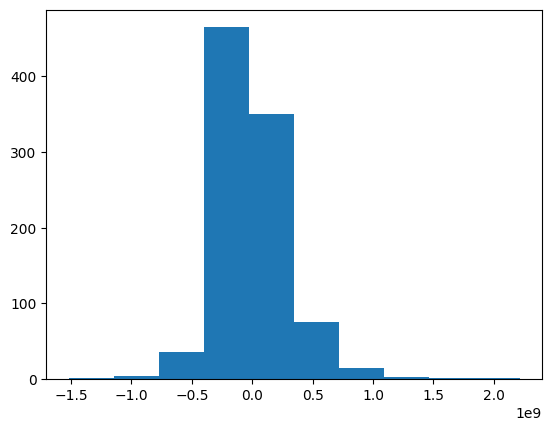

In [ ]:
#QQ plots for assessing normality
plt.hist(resid)


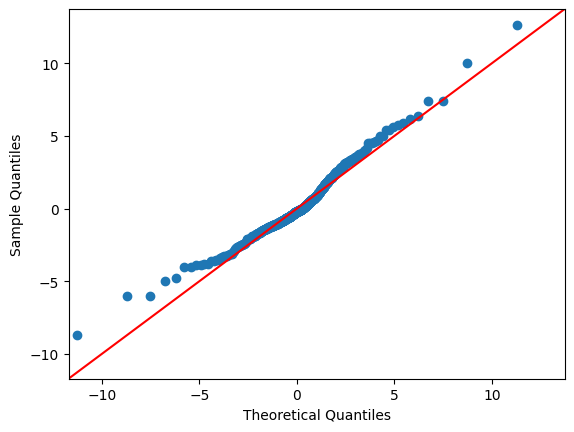

In [ ]:
import statsmodels.api as sm
import scipy.stats as stats
import matplotlib.pyplot as plt

# Assuming model and data setup as provided in your code

# Generate Q-Q plot
residuals = model.resid
fig = sm.qqplot(residuals, stats.t, fit=True, line="45")

# Label the axes
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.show()

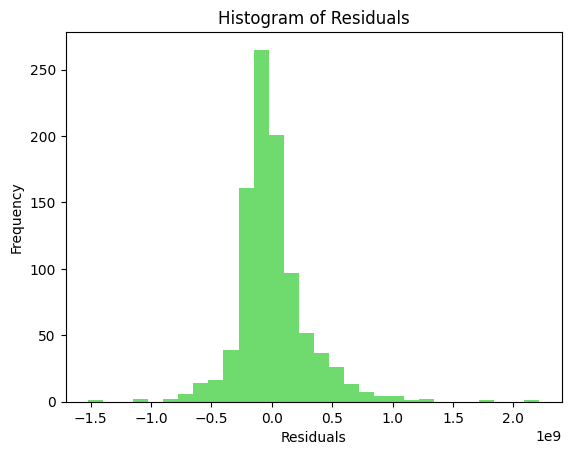

In [ ]:
plt.hist(residuals, bins=30, color='limegreen', alpha=0.7)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()